In [ ]:
#!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"


Archive:  /content/drive/MyDrive/Dog Vision/dog-breed-identification.zip
replace /content/drive/MyDrive/Dog Vision/labels.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

## End to End Multiclass  Dog Breed Classification


## 1. Problem
To identify different breeds of dogs

## 2. Data

Kaggle's Dog breed classification

https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evaluation

The evaluation is a file with prediction probabilities for each of the dog breed for the test image

https://www.kaggle.com/competitions/dog-breed-identification/overview


## 4.Features

Some information about the data:
* We're dealing with unstructured data (image)
* So better if we use deep learning/ transfer learning
* We have 120 different dog breeds
* There are around 10000 data in the training set (these are with label)
* There are around 10000 data in the test set (these are without labels)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Unzip the uploaded data into google drive
!unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"


Streaming output truncated to the last 5000 lines.
  inflating: /content/drive/MyDrive/Dog Vision/train/83bc62b0fffa99a9c94ba0b67a5f7395.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83bcff6b55ee179a7c123fa6103c377a.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83be6d622ab74a5e7e08b53eb8fd566a.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83c2d7419b0429b9fe953bc1b6cddbec.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83cf7d7cd2a759a93e2ffd95bea9c6fb.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83d405858f0931722ef21e8ac0adee4d.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83d4125a4c3c7dc5956563276cb1cd74.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83f0bb565b2186dbcc6a9d009cb26ff2.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83fad0718581a696132c96c166472627.jpg  
  inflating: /content/drive/MyDrive/Dog Vision/train/83fbbcc9a612e3f712b1ba199da61f20.jpg  
  inflating: /content/drive/M

##  Getting our workspace ready
* Import TensorFlow 2.x
* Import TensorFlow Hub
* Make sure we're using a GPU


In [ ]:
import os
x=len(os.listdir("drive/MyDrive/Dog Vision/train"))
y=len(os.listdir("drive/MyDrive/Dog Vision/test"))
x,y

(10222, 10357)

In [ ]:
#Import necessary tools
import tensorflow as tf
import tensorflow_hub as hub
print("TF version:", tf.__version__)
print("TF HUB version:", hub.__version__)

#Check for GPU Availability
print("GPU", "availability (YES!!!)" if tf.config.list_physical_devices("GPU") else "not available")

TF version: 2.15.0
TF HUB version: 0.16.1
GPU availability (YES!!!)


## Getting our data ready
 Convert images to tensors (numerical values).

Lets start by accessing our data and checking out the labels


In [ ]:
import pandas as pd
labels_csv=pd.read_csv("/content/drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()


,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# How many images are there of each brees?
labels_csv.groupby("breed")["id"].count()

breed
affenpinscher                      80
afghan_hound                      116
african_hunting_dog                86
airedale                          107
american_staffordshire_terrier     74
                                 ... 
welsh_springer_spaniel             79
west_highland_white_terrier        81
whippet                            95
wire-haired_fox_terrier            82
yorkshire_terrier                  82
Name: id, Length: 120, dtype: int64

<Axes: >

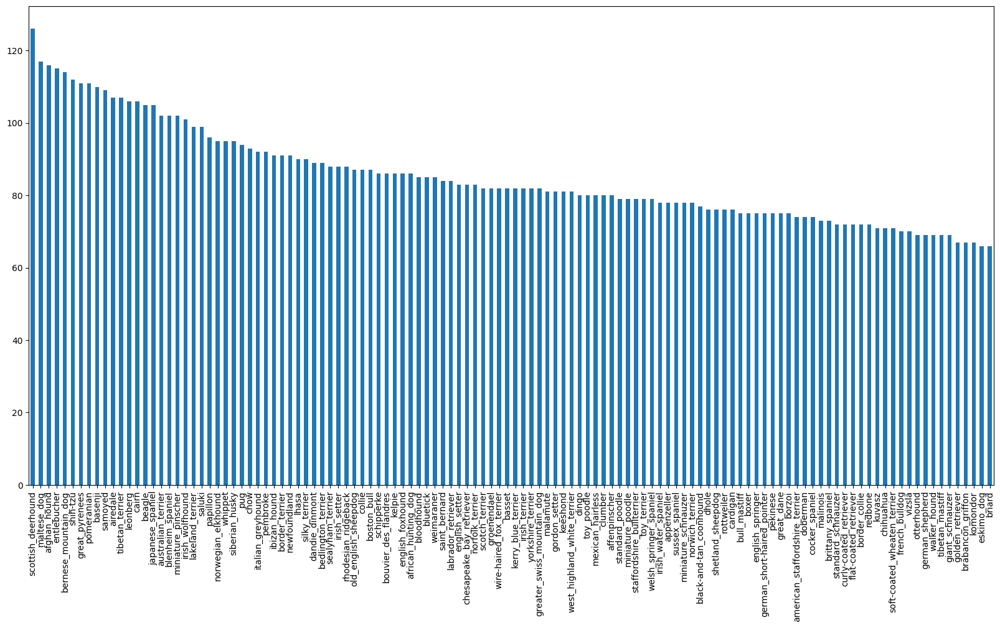

In [ ]:
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

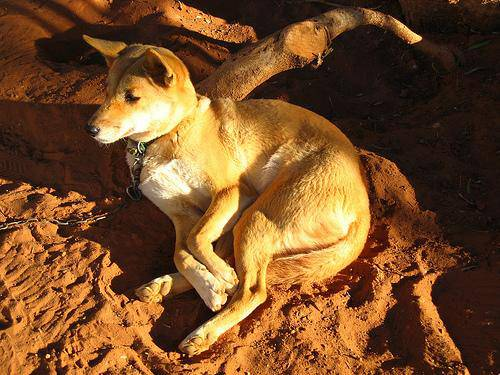

In [ ]:
#Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Lets get a list of all our image file pathnames

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
#Create pathnames from image ID's

filenames=["drive/MyDrive/Dog Vision/train/" + fname for fname in labels_csv["id"] + ".jpg"]

#Check the first 10

filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
import os
os.listdir("drive/MyDrive/Dog Vision/train/")[:10]

['000bec180eb18c7604dcecc8fe0dba07.jpg',
 '001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 '001cdf01b096e06d78e9e5112d419397.jpg',
 '00214f311d5d2247d5dfe4fe24b2303d.jpg',
 '0021f9ceb3235effd7fcde7f7538ed62.jpg',
 '002211c81b498ef88e1b40b9abf84e1d.jpg',
 '00290d3e1fdd27226ba27a8ce248ce85.jpg',
 '002a283a315af96eaea0e28e7163b21b.jpg',
 '003df8b8a8b05244b1d920bb6cf451f9.jpg',
 '0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
#Check whether the number of filenames equal the actual number of images

import os

if (len(os.listdir("drive/MyDrive/Dog Vision/train/"))==len(filenames)):
  print("Filenames match actual amount of files. Proceed!!")
else:
  print("Filenames do not match the actual amount of files. Check the target directory")



Filenames match actual amount of files. Proceed!!


In [ ]:
len(filenames)

10222

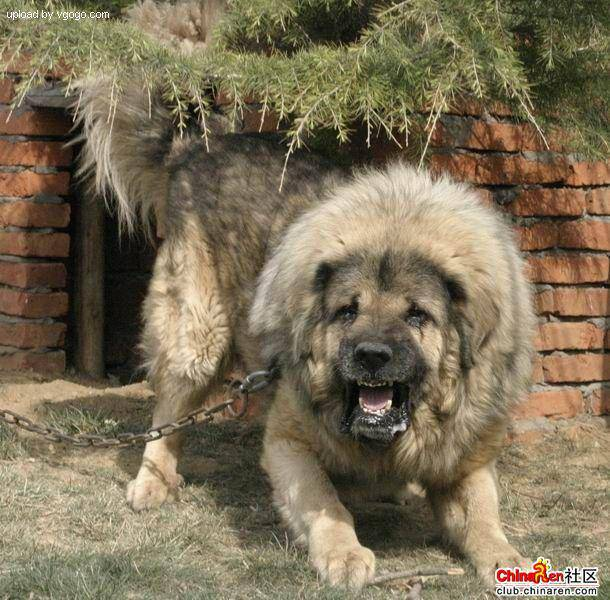

In [ ]:
#One last check
Image(filenames[9000])


In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training image filepaths in a list, let's prepare our labels

In [ ]:
import numpy as np
labels=np.array(labels_csv["breed"])
#labels=labels_csv["breed"].to_numpy() Does the same thing
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames (To check for missing data)
if len(labels)==len(filenames):
  print("Number of labels matches number of filenames. No missing data")
else:
  print("Number of labels do not match number of filenames. There is missing data. Check directory")

Number of labels matches number of filenames. No missing data


In [ ]:
#Find the unique label values
unique_breeds=np.unique(labels)
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(unique_breeds)

120

In [ ]:
# Turn labels into an array of booleans
# Turn a single label to into an array of booleans
print(labels[0])
labels[0]==unique_breeds # It creates a comparison operator
#It returns an array, similar to unique_breeds
# only the breed where labels[0] matches becomes True


boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
#Turn every label into a boolean array
boolean_labels=[label == unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: turning boolean array into integers
print(labels[0]) #original label
print(np.where(unique_breeds==labels[0])) #Index where label occurs in unique_breeds
print(boolean_labels[0].argmax()) #Index where label occurs in boolean_labels array
print(boolean_labels[0].astype(int)) #There will be 1 where the sample label is occurs


boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
print(labels[2])
print(boolean_labels[2].argmax())
print(boolean_labels[2].astype(int))

pekinese
85
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

## Creating our own Validation Set
Since the data in Kaggle do not come with a Validation set, we create one.

In [ ]:
#Setup X and y variables
X=filenames
y=boolean_labels


We're going to start off experimenting with ~1000 images and increase as we need

In [ ]:
#Set number of Images to use for experimenting
NUM_IMAGES= 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
#Lets split our data into train and validation
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val =train_test_split( X[:NUM_IMAGES],
                                                 y[:NUM_IMAGES],
                                                  test_size=0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
  X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing images (Turning images to tensors)
To preprocess our images we're going to write a function that does a few thigs.
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable 'image'
3. Turn our image (a 'jpg') to Tensors
4. Normalise our image. Convert color channelvalues form 0 to 255 to 0 to 1
5. Resize the image to a standard size shape of (224,224)
6. Return the modified image   

Before we do, let's see what importing an image looks like

In [ ]:
#Convert image to numpy array
from matplotlib.pyplot import imread
image=imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]],

       [[ 56, 104,  66],
        [ 58, 106,  68],
        [ 64, 112,  74],
        ...,
        [ 71, 127,  82],
        [ 73, 129,  84],
        [ 74, 130,  85]],

       ...,

       [[  2,  11,  10],
        [  5,  14,  11],
        [  8,  14,  14],
        ...,
        [120, 113,  67],
        [126, 118,  71],
        [122, 114,  67]],

       [[  0,   3,   7],
        [  2,   7,  10],
        [  3,   9,   7],
        ...,
        [105,  98,  54],
        [112, 104,  58],
        [111, 103,  57]],

       [[ 16,  18,  30],
        [ 16,  19,  24],
        [ 15,  20,  14],
        ...,
        [101,  92,  51],
        [ 97,  88,  47],
        [120, 111,  70]]

In [ ]:
image[:2]

array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)

In [ ]:
#turn image to a tensor
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  89],
        [ 76, 124,  76],
        [ 63, 111,  61],
        ...,
        [ 77, 133,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  75],
        [ 67, 114,  68],
        [ 63, 110,  64],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 132,  84]]], dtype=uint8)>

Now we've seen what an image looks like as a Tensor, let's make a function to preprocess them
1. Take an image filepath as input
2. Use TensorFlow to read the file and save it to a variable 'image'
3. Turn our image (a 'jpg') to Tensors
4. Resize the image to a standard size shape of (224,224)
5. Return the modified image   

In [ ]:
#Define image size
IMG_SIZE= 224


#Create a function for preprocessing images

def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor
  """
  # Read in an image file
  image=tf.io.read_file(image_path)
  # Turn the Jpeg image into numerical Tensor with three colour channels (Red, Green, Blue)
  image= tf.image.decode_jpeg(image, channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values
  image=tf.image.convert_image_dtype(image, tf.float32)
  #Resize the image to our desired value
  image=tf.image.resize(image, size=[IMG_SIZE,IMG_SIZE])

  return image

In [ ]:
process_image(filenames[26])

<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
array([[[0.25410587, 0.2894    , 0.2776353 ],
        [0.29784313, 0.33313724, 0.32137254],
        [0.29804096, 0.33333507, 0.32157037],
        ...,
        [0.41461015, 0.46559054, 0.38715917],
        [0.44833592, 0.4993163 , 0.42088494],
        [0.44921985, 0.5002003 , 0.42176887]],

       [[0.27608263, 0.31137675, 0.29961205],
        [0.30547515, 0.34076926, 0.32900456],
        [0.2880393 , 0.3233334 , 0.3115687 ],
        ...,
        [0.41783687, 0.46881726, 0.3903859 ],
        [0.46009547, 0.51107585, 0.4326445 ],
        [0.48616162, 0.537142  , 0.45871064]],

       [[0.29875293, 0.33404705, 0.3144392 ],
        [0.27189255, 0.30718666, 0.28757882],
        [0.28608775, 0.32138187, 0.30177402],
        ...,
        [0.47503573, 0.5260161 , 0.44758475],
        [0.49345425, 0.54443467, 0.46600327],
        [0.4703167 , 0.5212971 , 0.44286573]],

       ...,

       [[0.77551085, 0.7260472 , 0.59820485],
        [0.86

## Turning our data into batches

Why turn our data into batches?

Let's say we are trying to process 10000 images in one go and find patterns between them...
They all might not fit into memory.
That's why we do about 32 (this is the batch size) images at a time(we can manually adjust the batch size if we need).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
'(image, label)' where image is in the form of Tensor and label is the boolean_label

In [ ]:
# Create a simple function to return a tuple (image, label)
def get_image_label(image_path, label):
  image=process_image(image_path)
  return image, label


In [ ]:
# Demo of the above
get_image_label(X[42], tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.3264178 , 0.5222886 , 0.3232816 ],
         [0.2537167 , 0.44366494, 0.24117757],
         [0.25699762, 0.4467087 , 0.23893751],
         ...,
         [0.29325107, 0.5189916 , 0.3215547 ],
         [0.29721776, 0.52466875, 0.33030328],
         [0.2948505 , 0.5223015 , 0.33406618]],
 
        [[0.25903144, 0.4537807 , 0.27294815],
         [0.24375686, 0.4407019 , 0.2554778 ],
         [0.2838985 , 0.47213382, 0.28298813],
         ...,
         [0.2785345 , 0.5027992 , 0.31004712],
         [0.28428748, 0.5108719 , 0.32523635],
         [0.28821915, 0.5148036 , 0.32916805]],
 
        [[0.20941195, 0.40692952, 0.25792548],
         [0.24045378, 0.43900946, 0.2868911 ],
         [0.29001117, 0.47937486, 0.32247734],
         ...,
         [0.26074055, 0.48414773, 0.30125174],
         [0.27101526, 0.49454468, 0.32096273],
         [0.27939945, 0.5029289 , 0.32934693]],
 
        ...,
 
        [[0.00634795, 0.03442048

Now we've got a way to turn our data into tuples of Tensors in the form '(image, label)'. Let's make a function to turn all our data (X and y) into batches.


In [ ]:
# Define the batch size. 32 is a good start
BATCH_SIZE=32
# create a function to turn data into batches
def create_data_batches(X,y=None, batch_size=BATCH_SIZE, valid_data=False, test_data=False):
  """
  Creates batches of data out of image (X) and label (y)
  It shuffles the data if it's training data but doesn't shuffle if it's validation data
  Also accepts test data as input (no labels).
  """
  # If the data is a test dataset, it wont have labels
  if test_data:
    print("Cretaing test data batches")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X))) #Only filepaths. No labels
    data_batch=data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  # If the dataset is a valisation set, no need to shuffle it
  elif valid_data:
    print("Creating Validation data batches...")
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                            tf.constant(y))) #labels
    data_batch=data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating training data batches")
    # Turn filepaths and labels into Tensors
    data=tf.data.Dataset.from_tensor_slices((tf.constant(X), #filepaths
                                            tf.constant(y))) #labels
    #Shuffling pathnames and labels before mapping image processor is faster than shiffling images
    data=data.shuffle(buffer_size=len(X))

    #Creates (image, label) tuples
    data=data.map(get_image_label)

    #Turn the training data into batches
    data_batch=data.batch(BATCH_SIZE)
  return data_batch



In [ ]:
#create training and validation data batches
train_data=create_data_batches(X_train, y_train)
val_data=create_data_batches(X_val, y_val, valid_data=True)

Creating training data batches
Creating Validation data batches...


In [ ]:
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visulalizing Data Batches
Our data is now in batches, but it is hard to understand and comprehend. Let's visualize them

In [ ]:
import matplotlib.pyplot as plt

#Create a function for viewing images in a data bacth
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels
  """
  #Setup the figure
  plt.figure(figsize=(10,10))
  #Loop through 25 (for displaying 25 images)
  for i in range(25):
    # Create subplots (5 rows and 5 columns)
    ax=plt.subplot(5,5,i+1)
    #Display an image
    plt.imshow(images[i])
    #Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    #Turn off the grid
    #plt.axis("off")


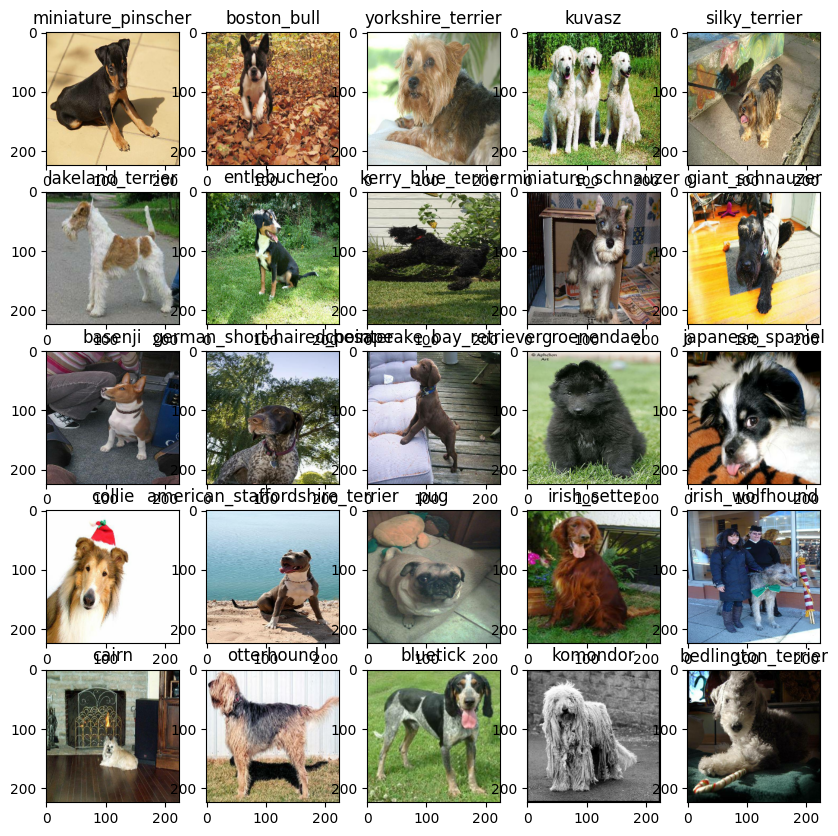

In [ ]:
#Let's visualize that data in a training batch
train_images, train_labels= next(train_data.as_numpy_iterator())
train_images, train_labels

show_25_images(train_images, train_labels)

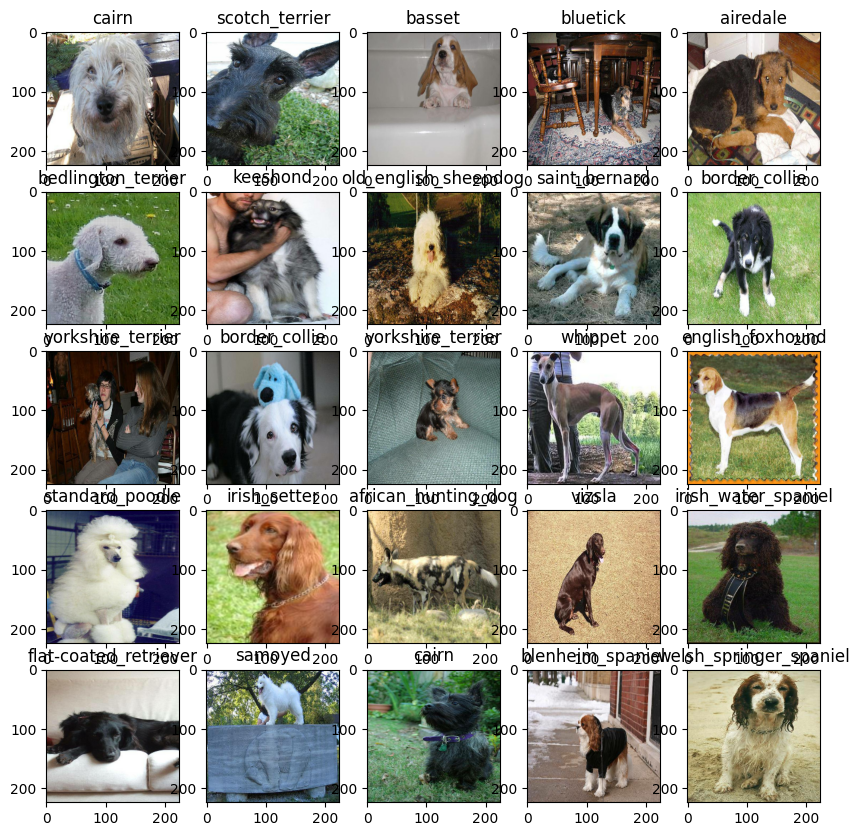

In [ ]:
#Lets visualise validation set
val_images, val_labels= next(val_data.as_numpy_iterator())
val_images, val_labels
show_25_images(val_images, val_labels)

## Building a model

Before we build model, there are few things we need to define

* The input shape (of our images shape, in the form of Tensors) to our model
* The output shape (image labels in the form of Tensors), to our model
* The URL of the model we want to use from tensorflow hub is:
https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4

In [ ]:
#Setup input shape to the model
INPUT_SHAPE=[None, IMG_SIZE, IMG_SIZE, 3]#batch, height, width, color channels


#Setup output shape of our model
OUTPUT_SHAPE=len(unique_breeds)

#Setup model URL from TensorFlow Hub

MODEL_URL= "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [ ]:
IMG_SIZE

224

Now we've got our inputs, outputs and model ready to go. Let's put them together in a Keras Deep Learning model

Create a function which:
* Takes the input shape, output shape, and the model whuch we are using as parameters.
* Defines the layers in a Keras model in a Sequential fashion (do this, then that, one after the other).
* Compliiles the model (Says it should be evaluated and improved)
* Builds the model(telss the model the input shape it'll be getting)
* Returns the model\

All of these steps can be foound here: https://www.tensorflow.org/guide/keras

In [ ]:
# Creates a function that builds a Keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", MODEL_URL)

  #Setup the model layers
  model=tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Layer 1 (Input Layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                            activation="softmax") #Layer 2 (Output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  #Build the model
  model.build(INPUT_SHAPE)

  return model


In [ ]:
model=create_model()
model.summary()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


In [ ]:
output=np.ones([1,1280])
output

array([[1., 1., 1., ..., 1., 1., 1.]])

## Creating callbacks
Call backs are helper functions a model can use to do things while training such as save its progress, check its progress and stop training early if a model stops improving.

We'll create two callbacks, one for TensorBoard which helps track our model's progress, and another for early stopping which prevents our model from training for too long.

### TensorBoard Callback

To setup a TensorBoard callback, we need to to 3 things:
1. Load the TensorBoard notebook extension
2. Create a Tensorboard callback which is able to save logs to a directory and pass it to our model's 'fit()' function.
3. Visualize our model's training logswith the %tensorboard magic function (We'll do this after model training)


In [ ]:
#Load tensorboard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

#Create a function to build a TensorBoard callback
def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard Logs
  logdir= os.path.join("drive/MyDrive/Dog Vision/logs",
                      #Make it so the logs get tracked whenever we run an experiment
                       datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)



### Early Stopping Callback

Early stopping helps stop our model from Overfitting by stopping training if a certain evaluation metric stops improving.

https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/EarlyStopping

In [ ]:
#Create early stopping callback

earlystopping=tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                               patience=3)

## Training a model on a subset of data.
Our firt model is only going to train 1000 images, to make sure everything is working

In [ ]:
NUM_EPOCHS= 100 #@param {type:"slider", min:10, max:100, step:10}

In [ ]:
import os
x=len(os.listdir("drive/MyDrive/Dog Vision/train"))
x

10222

Let's create a function which trains a model

* Create a model using create_model()
* Set up tensorboard callback using 'create_tensorboard_callback()"
* Call the 'fit()' fucntion on our model by passing it the training data, validation data, number of epochs to train for ('NUM_EPOCHS) and the callbacks (helper functions) which we'd like to use
* Return the model


In [ ]:
# Build a function and return a trained model
def train_model():
  """
  Trains a given model and returns the trained model
  """
  #Create a model
  model=create_model()

  #Create new tensorboard session everytime we create a model
  tensorboard=create_tensorboard_callback()

  #Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
            epochs=NUM_EPOCHS,
            validation_data=val_data,
            validation_freq=1,
            callbacks=[tensorboard,earlystopping])

  #Return the fitted model
  return model

In [ ]:
#Fit the model to the data
model=train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 8s 157ms/step - loss: 4.5669 - accuracy: 0.0925 - val_loss: 3.3927 - val_accuracy: 0.2550
Epoch 2/100
25/25 [==============================] - 4s 168ms/step - loss: 1.6364 - accuracy: 0.6737 - val_loss: 2.1536 - val_accuracy: 0.4550
Epoch 3/100
25/25 [==============================] - 4s 169ms/step - loss: 0.5714 - accuracy: 0.9362 - val_loss: 1.6992 - val_accuracy: 0.5400
Epoch 4/100
25/25 [==============================] - 4s 165ms/step - loss: 0.2541 - accuracy: 0.9862 - val_loss: 1.4935 - val_accuracy: 0.5850
Epoch 5/100
25/25 [==============================] - 5s 199ms/step - loss: 0.1475 - accuracy: 0.9987 - val_loss: 1.4219 - val_accuracy: 0.6000
Epoch 6/100
25/25 [==============================] - 4s 167ms/step - loss: 0.1009 - accuracy: 0.9987 - val_loss: 1.3769 - val_accuracy: 0.6050
Epoch 7/100
25/25 [==============================

**Question:** It looks like our model is overfitting because it's performing far better on the training datasetthan the validation dataset. What are some ways to prevent model overfititng in deep learning neural networks?

**Note:** Overfitting to begin with is a good thing! It means that our model is learning

### Checking the tensorboard logs

The TensorBoard Magic function ('%tensorboard') will access the logs directory we created earlier and visualise its contents


In [ ]:
%tensorboard --logdir drive/MyDrive/Dog\ Vision/logs

Output hidden; open in https://colab.research.google.com to view.

## Making and evaluating predictions on a trained model

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Make predictions on the validation data (not used to train on)
predictions=model.predict(val_data, verbose=1) #verbose is to ensure that while making predictions, we get to see the progress
predictions

7/7 [==============================] - 1s 105ms/step


array([[9.8512683e-04, 7.4546122e-05, 5.5830316e-03, ..., 7.7047525e-04,
        2.2700036e-04, 3.8322865e-03],
       [4.6251295e-03, 3.4428356e-04, 9.2151891e-03, ..., 4.7887786e-04,
        3.5653119e-03, 1.9925139e-04],
       [6.0287937e-07, 7.8734183e-06, 8.6945756e-06, ..., 3.5460873e-06,
        2.4649562e-05, 1.6651917e-05],
       ...,
       [1.1350645e-06, 3.3718832e-05, 3.7637909e-04, ..., 5.0231492e-06,
        9.7565600e-05, 2.4425595e-05],
       [8.6530839e-04, 1.7186653e-04, 4.3329150e-05, ..., 3.9321301e-05,
        4.5949299e-05, 7.2596036e-03],
       [2.1178479e-05, 2.7368804e-05, 1.2190494e-03, ..., 1.9855404e-03,
        1.2153598e-04, 3.5242658e-05]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
predictions[0]

array([9.85126826e-04, 7.45461221e-05, 5.58303157e-03, 1.46221792e-04,
       2.04003416e-04, 3.61098428e-05, 1.72724966e-02, 1.02894253e-03,
       5.13412815e-05, 1.12666865e-03, 1.95510365e-04, 2.46565440e-04,
       3.11015843e-04, 1.47422252e-04, 5.30047168e-04, 1.36113795e-03,
       1.56233873e-04, 2.19152063e-01, 1.12760545e-05, 1.01445930e-03,
       3.93987371e-04, 2.05641962e-03, 5.43313472e-05, 9.25116241e-04,
       9.21417668e-05, 2.58638756e-04, 1.06798649e-01, 6.22957159e-05,
       1.20345096e-03, 8.70134798e-04, 1.56584836e-03, 2.34400970e-03,
       2.63161201e-04, 2.43193481e-05, 2.50541838e-04, 2.37271022e-02,
       3.26276931e-05, 7.04968552e-05, 2.50464054e-05, 1.05879699e-04,
       2.12406437e-03, 5.47834898e-05, 9.99618671e-04, 4.19619202e-04,
       1.06986008e-04, 1.43796555e-04, 2.05507458e-05, 1.33379493e-04,
       5.34483581e-04, 1.39933705e-04, 9.40174505e-05, 1.90424926e-05,
       7.22492114e-04, 6.85387640e-05, 3.41180821e-05, 2.87250205e-05,
      

In [ ]:
#First Prediction
index=43
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum of all predictions (Should be close to 1): {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")


[1.30665594e-05 8.81335727e-05 1.62048727e-05 1.11213885e-05
 7.85470882e-04 4.29751439e-04 8.80881125e-05 8.11812293e-04
 2.51796678e-06 4.65536550e-06 4.59980620e-05 2.67295800e-02
 5.12019653e-07 6.94281538e-04 4.33479618e-05 9.14607517e-06
 3.59018415e-01 9.36102660e-05 9.61025828e-04 3.25086666e-03
 1.16599551e-06 1.85020999e-05 4.87446050e-06 2.33786636e-06
 5.23860333e-04 1.26299215e-04 5.48502658e-06 1.88953814e-03
 6.17280602e-06 4.03460444e-06 7.30439788e-05 4.77737485e-05
 4.96670662e-04 5.69697261e-01 2.17374909e-04 6.82583850e-05
 8.05119453e-06 1.03810735e-05 2.29257912e-05 7.80914706e-05
 2.42359485e-04 1.46907565e-04 3.72474897e-04 1.53937697e-04
 6.94218266e-04 3.06801917e-06 3.41743507e-05 4.69221368e-06
 1.78665403e-04 1.16198047e-04 3.58532839e-06 5.96314858e-05
 2.68707634e-03 1.75169680e-05 3.08393326e-04 2.41371556e-04
 9.30898659e-06 1.12671034e-04 3.12651573e-05 9.25714790e-04
 1.99054848e-04 4.36196942e-03 1.93319829e-05 7.83655778e-05
 1.17934405e-06 8.801035

* Having the above functionality is great, but we want to be able to do it at scale.
* And it would be even better if we could see the image, and actual correct label along with the predicted label.
* **Note:** Prediction probabilities are also known as confidence levels

In [ ]:
#Turn prediction probabilities into their respective labels (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilities into a label
  """
  return unique_breeds[np.argmax(prediction_probabilities)]


In [ ]:
#Get a predicted label based on an array of prediction probabilities
pred_label= get_pred_label(predictions[81])
pred_label

'chihuahua'

Now since our val_data is still in a batch dataset, we'll have to unbatch  it to make predictions on the validation images, and compare those predictions to the validation labels (truth labels)

In [ ]:
images_=[]
labels_=[]

#Loop through unbatched data
for image, label in val_data.unbatch().as_numpy_iterator():
  images_.append(image)
  labels_.append(label)
images_[0], labels_[0]

(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

In [ ]:
#Create in a functionized form
def unbatchify(data):
  """
  Takes a batched datset of (image, label) tensors and returns separate arrays of
  images and labels
  """
  images_=[]
  labels_=[]

  #Loop through inbatched data

  for image, label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(unique_breeds[np.argmax(label)])

  return images_, labels_

#Unbatchify the validation data

val_images, val_labels=unbatchify(val_data)

val_images[0], val_labels[0]


(array([[[0.29599646, 0.43284872, 0.3056691 ],
         [0.26635826, 0.32996926, 0.22846507],
         [0.31428418, 0.27701408, 0.22934894],
         ...,
         [0.77614343, 0.82320225, 0.8101595 ],
         [0.81291157, 0.8285351 , 0.8406944 ],
         [0.8209297 , 0.8263737 , 0.8423668 ]],
 
        [[0.2344871 , 0.31603682, 0.19543913],
         [0.3414841 , 0.36560842, 0.27241898],
         [0.45016077, 0.40117094, 0.33964607],
         ...,
         [0.7663987 , 0.8134138 , 0.81350833],
         [0.7304248 , 0.75012016, 0.76590735],
         [0.74518913, 0.76002574, 0.7830809 ]],
 
        [[0.30157745, 0.3082587 , 0.21018331],
         [0.2905954 , 0.27066195, 0.18401104],
         [0.4138316 , 0.36170745, 0.2964005 ],
         ...,
         [0.79871625, 0.8418535 , 0.8606443 ],
         [0.7957738 , 0.82859945, 0.8605655 ],
         [0.75181633, 0.77904975, 0.8155256 ]],
 
        ...,
 
        [[0.9746779 , 0.9878955 , 0.9342279 ],
         [0.99153054, 0.99772066, 0.94278

In [ ]:
get_pred_label(labels_[0])

'cairn'

In [ ]:
get_pred_label(predictions[0])

'border_terrier'

Now we've got ways to get:
* Prediction Labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these a bit more visulaized.

We'll create a fucntion which:

* Takes an array of prediction probabilities, an array of truth labels, and an array of image and an integer.
* Converts the prediction probabilities to prediction labels
* Plot the predicted label, it's predicted probability, the truth label and the target image on a single plot


In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the prediction, ground truth and image for sample n
  """
  pred_prob, true_label, image= prediction_probabilities[n], labels[n], images[n]

  #Get the pred_label

  pred_label=get_pred_label(pred_prob)

  #Plot image and remove ticks

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  #Change the color of the title depending on right prediction or wrong
  if pred_label==true_label:
    color="green"
  else:
    color="red"

  #Change plot tile to be predicted label, probability of prdiction and true label

  plt.title("{} {:2.0f}% {}".format(pred_label,
                                    np.max(pred_prob)*100,
                                    true_label), color=color)

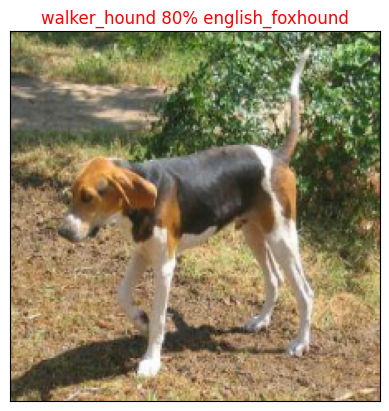

In [ ]:
plot_pred(prediction_probabilities=predictions,
          labels=val_labels,
          images=val_images, n=42)

Now we've got one function to visualize our model's top predictions. Let's make another too view our model's top 10 predictions:
This fucntion will:
* Take an input of the prediction probabilities array
* Find the prediction using get_pred_label()
* Find the top 10:

    * Prediction probability indexes (For a given trained image, we need to visualize what are second and third upto tenth best orediction for our image.
    * Prediction probabilities values
    * Prediction labels
* Plot the top 10 prediction probabilty values, and labels, and coloring true green


In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plus the top 10 highest confidence levels
  along with truth label for sample n
  """
  pred_prob, true_label=prediction_probabilities[n], labels[n]

  # Get the predicted label

  pred_label=get_pred_label(pred_prob)

  #Find the top 10 prediction probabilities

  top_10_pred_indexes=pred_prob.argsort()[-10:][::-1]

  #Find the top 10 prediction confidence values

  top_10_pred_values=pred_prob[top_10_pred_indexes]

  #Find the top 10 prediction  labels

  top_10_pred_labels=unique_breeds[top_10_pred_indexes]

  #Setup plot

  top_plot=plt.bar(np.arange(len(top_10_pred_labels)),
                   top_10_pred_values,
                   color="grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels=top_10_pred_labels,
             rotation="vertical")

  #Change the color of true label

  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels==true_label)].set_color("green")
  else:
    pass

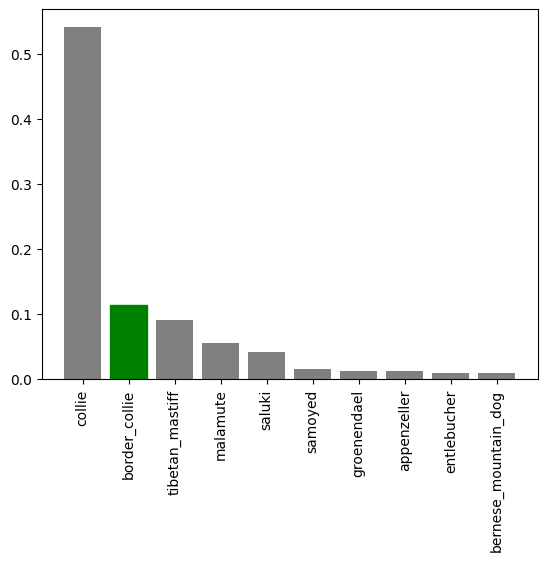

In [ ]:
plot_pred_conf(prediction_probabilities=predictions,
               labels=val_labels,
               n=9)

Now we've got some functions to visualize our predictions and evaluate our models, let's check out a few:


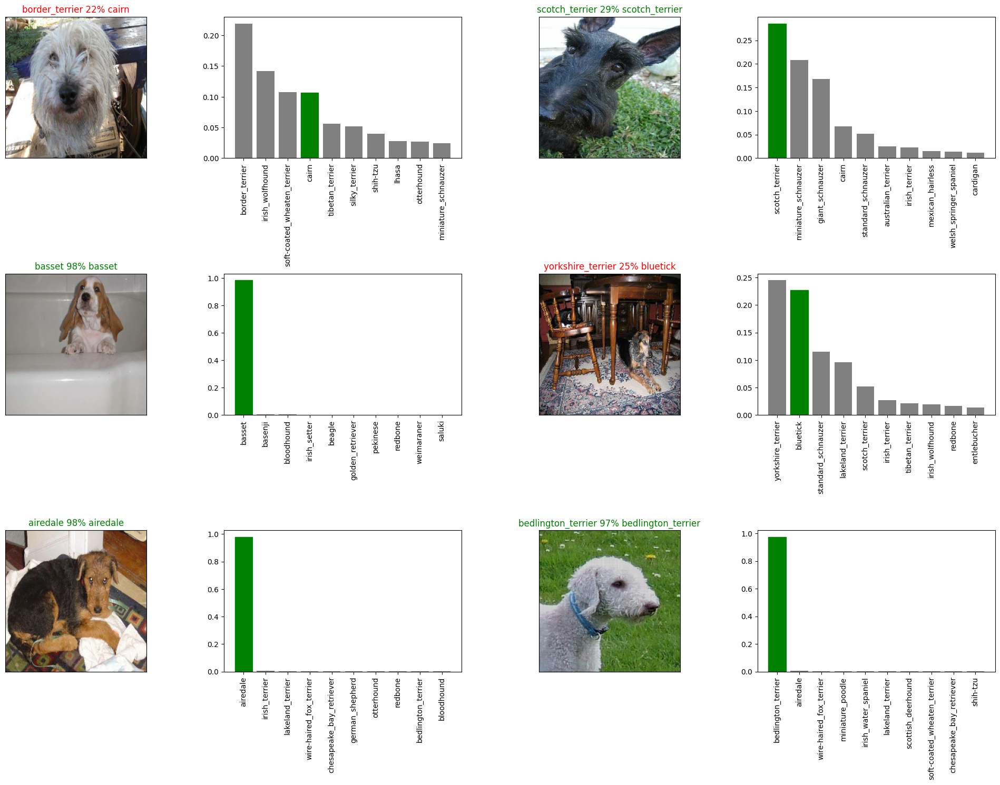

In [ ]:
#Let's check out a few predictions and their different values

i_multiplier=0
num_rows=3
num_cols=2
num_images=num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows, 2*num_cols, 2*i+1)
  plot_pred(prediction_probabilities=predictions,
            labels=val_labels,
            images=val_images,
            n=i+i_multiplier)
  plt.subplot(num_rows, 2*num_cols, 2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,
                 labels=val_labels,
                 n=i+i_multiplier)
plt.tight_layout(h_pad=1.0)
plt.show()

**Challenge** How would you create a confusion matrix based on our models predictiosn and true labels?


## Create a function to save a model

In [ ]:
def save_model(model, suffix=None):
  """
  Saves a given model in the models directory and appends a suffix (string)
  """
  #Create a model directory pathname with current time
  modeldir=os.path.join("drive/MyDrive/Dog Vision/models",
                        datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path=modeldir + "-" + suffix + ".h5" # Save format
  print(f"Saving model to: {model_path}...")
  model.save(model_path)
  return model_path

In [ ]:
#Create a function to load a trained model

def load_model(model_path):
  """
  Loads a saved model from a specific path
  """
  print(f"Loading saved model from: {model_path}")
  model=tf.keras.models.load_model(model_path,
                                   custom_objects={"KerasLayer":hub.KerasLayer})
  return model


Now we've got functions to load and save a model

In [ ]:
#Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240211-11061707649608-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240211-11061707649608-1000-images-mobilenetv2-Adam.h5'

In [ ]:
#Load model


loaded_1000_image_model=load_model("drive/MyDrive/Dog Vision/models/20240211-11061707649608-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20240211-11061707649608-1000-images-mobilenetv2-Adam.h5


In [ ]:
#Evaluate pre loaded model
model.evaluate(val_data)

7/7 [==============================] - 1s 110ms/step - loss: 1.2462 - accuracy: 0.6400


[1.2461516857147217, 0.6399999856948853]

In [ ]:
#Evaluare loaded model
loaded_1000_image_model.evaluate(val_data)

7/7 [==============================] - 1s 108ms/step - loss: 1.2462 - accuracy: 0.6400


[1.2461516857147217, 0.6399999856948853]

# Training a BIG DOG MODEL(ON FULL DATA)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
#Create a data batch with full dataset
full_data=create_data_batches(X,y)

Creating training data batches


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
#Create a model for full model
full_model=create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [ ]:
#Create full model callbacks
full_model_tensorboard=create_tensorboard_callback()
#No validation set on full data, so we cant monitor validation accuracy
full_model_early_stopping=tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                           patience=3)

In [ ]:
#Fit the full model
full_model.fit(x=full_data,
               epochs=NUM_EPOCHS,
               callbacks=[full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 52s 145ms/step - loss: 1.3569 - accuracy: 0.6709
Epoch 2/100
320/320 [==============================] - 42s 131ms/step - loss: 0.4038 - accuracy: 0.8836
Epoch 3/100
320/320 [==============================] - 43s 135ms/step - loss: 0.2383 - accuracy: 0.9327
Epoch 4/100
320/320 [==============================] - 52s 163ms/step - loss: 0.1529 - accuracy: 0.9648
Epoch 5/100
320/320 [==============================] - 49s 152ms/step - loss: 0.1033 - accuracy: 0.9797
Epoch 6/100
320/320 [==============================] - 44s 136ms/step - loss: 0.0774 - accuracy: 0.9862
Epoch 7/100
320/320 [==============================] - 41s 129ms/step - loss: 0.0590 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 43s 133ms/step - loss: 0.0462 - accuracy: 0.9935
Epoch 9/100
320/320 [==============================] - 43s 134ms/step - loss: 0.0367 - accuracy: 0.9966
Epoch 10/100
320/320 [==============================] - 42s 130m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to: drive/MyDrive/Dog Vision/models/20240211-11351707651338-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3103: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/MyDrive/Dog Vision/models/20240211-11351707651338-full-image-set-mobilenetv2-Adam.h5'

In [99]:
#Load in the full model
loaded_full_model=load_model("drive/MyDrive/Dog Vision/models/20240211-11351707651338-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/MyDrive/Dog Vision/models/20240211-11351707651338-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset
We import the test folder and use create_data_batches to create test data batches and predict

In [100]:
#Load test image file names
test_path="drive/MyDrive/Dog Vision/test/"
test_filenames=[test_path + fname for fname in os.listdir(test_path)]
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/000621fb3cbb32d8935728e48679680e.jpg',
 'drive/MyDrive/Dog Vision/test/00102ee9d8eb90812350685311fe5890.jpg',
 'drive/MyDrive/Dog Vision/test/0012a730dfa437f5f3613fb75efcd4ce.jpg',
 'drive/MyDrive/Dog Vision/test/001510bc8570bbeee98c8d80c8a95ec1.jpg',
 'drive/MyDrive/Dog Vision/test/001a5f3114548acdefa3d4da05474c2e.jpg',
 'drive/MyDrive/Dog Vision/test/00225dcd3e4d2410dd53239f95c0352f.jpg',
 'drive/MyDrive/Dog Vision/test/002c2a3117c2193b4d26400ce431eebd.jpg',
 'drive/MyDrive/Dog Vision/test/002c58d413a521ae8d1a5daeb35fc803.jpg',
 'drive/MyDrive/Dog Vision/test/002f80396f1e3db687c5932d7978b196.jpg',
 'drive/MyDrive/Dog Vision/test/0036c6bcec6031be9e62a257b1c3c442.jpg']

In [101]:
len(test_filenames)

10357

In [102]:
#Create test data batch
test_data = create_data_batches(test_filenames, test_data=True)

Cretaing test data batches


In [103]:
#Calling predict() on full model
test_predictions=loaded_full_model.predict(test_data,
                                           verbose=1)

324/324 [==============================] - 44s 133ms/step


In [106]:
#Savve predictions(Numpy array) to csv file for later access
np.savetxt("drive/MyDrive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")


In [107]:
#Load predictions csv array
#test_pred=np.loadtxt("drive/MyDrive/Dog Vision/preds_array.csv", delimiter=",")

In [108]:
test_predictions.shape

(10357, 120)

In [109]:
test_predictions[:10]

array([[1.17944456e-12, 6.57761129e-12, 7.33748050e-15, ...,
        1.72148605e-14, 1.14702615e-10, 8.26593915e-12],
       [5.57467911e-06, 9.64366677e-07, 5.82274229e-09, ...,
        5.04488985e-11, 1.16653155e-07, 2.68603162e-09],
       [5.49980478e-11, 2.86041495e-06, 1.24406014e-08, ...,
        1.01005519e-07, 3.49879237e-10, 7.81004775e-11],
       ...,
       [1.56559310e-09, 6.69075628e-11, 2.17306121e-11, ...,
        3.29658241e-12, 2.92209247e-12, 5.27100204e-11],
       [1.05803595e-11, 2.17895604e-10, 6.31207864e-11, ...,
        1.69243719e-07, 1.66518632e-09, 2.06791372e-11],
       [1.87947014e-09, 3.13724983e-11, 2.46320707e-11, ...,
        6.36780071e-13, 1.01075801e-10, 5.27452606e-08]], dtype=float32)

## Preparing test dataset predictions for Kaggle

In [110]:
#Create a Pandas DataFrame with empty columns
preds_df= pd.DataFrame(columns=["id"]+list(unique_breeds))
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier


In [111]:
import os
os.listdir(test_path)[10]

'0041940322116ae58c38130f5a6f71f9.jpg'

In [115]:
#Append test image ID's to predictions dataframe
test_ids=[os.path.splitext(path)[0] for path in os.listdir(test_path)]
preds_df['id']=test_ids


In [116]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,00102ee9d8eb90812350685311fe5890,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,0012a730dfa437f5f3613fb75efcd4ce,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,001510bc8570bbeee98c8d80c8a95ec1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,001a5f3114548acdefa3d4da05474c2e,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [118]:
preds_df[list(unique_breeds)]=test_predictions

In [119]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,000621fb3cbb32d8935728e48679680e,1.179445e-12,6.577611e-12,7.337481e-15,4.273440e-14,4.781530e-13,2.528298e-12,3.425912e-16,4.734629e-13,6.868147e-15,...,1.478627e-12,6.854998e-14,5.642985e-14,1.179304e-14,1.449244e-14,3.976022e-13,1.912751e-13,1.721486e-14,1.147026e-10,8.265939e-12
1,00102ee9d8eb90812350685311fe5890,5.574679e-06,9.643667e-07,5.822742e-09,1.509071e-09,3.660735e-07,1.478329e-08,8.475337e-07,1.161893e-06,2.358060e-08,...,5.951713e-09,1.028303e-06,3.044212e-09,7.005519e-07,6.453397e-08,6.712737e-08,3.519305e-04,5.044890e-11,1.166532e-07,2.686032e-09
2,0012a730dfa437f5f3613fb75efcd4ce,5.499805e-11,2.860415e-06,1.244060e-08,2.124316e-10,1.006974e-10,2.999840e-08,2.906115e-11,4.789580e-12,6.847119e-09,...,3.067163e-11,8.391354e-11,1.347041e-07,3.135233e-06,1.205096e-07,3.481853e-08,9.561075e-12,1.010055e-07,3.498792e-10,7.810048e-11
3,001510bc8570bbeee98c8d80c8a95ec1,9.571568e-07,1.900029e-07,4.634197e-07,2.585916e-06,6.564818e-05,7.618031e-07,2.370499e-11,2.515696e-09,4.913786e-08,...,3.674660e-07,5.827895e-10,2.311664e-06,7.116964e-10,1.206691e-07,1.231241e-09,1.146977e-14,6.965878e-03,1.283358e-10,4.363073e-08
4,001a5f3114548acdefa3d4da05474c2e,3.146958e-05,1.153420e-05,4.512707e-09,4.256081e-10,8.134133e-10,1.108580e-11,1.087375e-10,2.906679e-09,9.787413e-10,...,6.449134e-08,3.486621e-11,5.000054e-11,1.179038e-11,1.982586e-10,7.381392e-10,1.151563e-11,1.785957e-09,3.785372e-10,1.710523e-08


In [120]:
#Save our prediction Dataframe as csv to submit in Kaggle
preds_df.to_csv("drive/MyDrive/Dog Vision/full_model_prediction_submission_1_mobilenetV2.csv",
                index=False)

## Making Images on Custom Images